# Проект по исследованию рынка общественного питания в Москве

## Описание проекта


Инвесторы решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Задача — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Описание данных

**Файл moscow_places.csv:**

    name — название заведения;
    address — адрес заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500»;
    - «Цена чашки капучино: 130–220»;
    - «Цена бокала пива: 400–600» и так далее;

    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

    middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
        
    chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
    district — административный район, в котором находится заведение, например Центральный административный округ;
    seats — количество посадочных мест.

## Шаг 1. Загрузим данные и изучим общую информацию

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import numpy as np
from datetime import datetime, timedelta
from scipy import stats as st
from pandas.plotting import register_matplotlib_converters
import pylab 
import plotly.express as px 
import missingno as msno
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster


pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option('display.max_colwidth', None)

In [2]:
try:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00


Файл открылся без замечаний.

## Шаг 2. Выполним предобработку данных

In [5]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [6]:
df['category'] = df['category'].str.replace('бар,паб', 'бар, паб')

In [7]:
df.duplicated().sum()

0

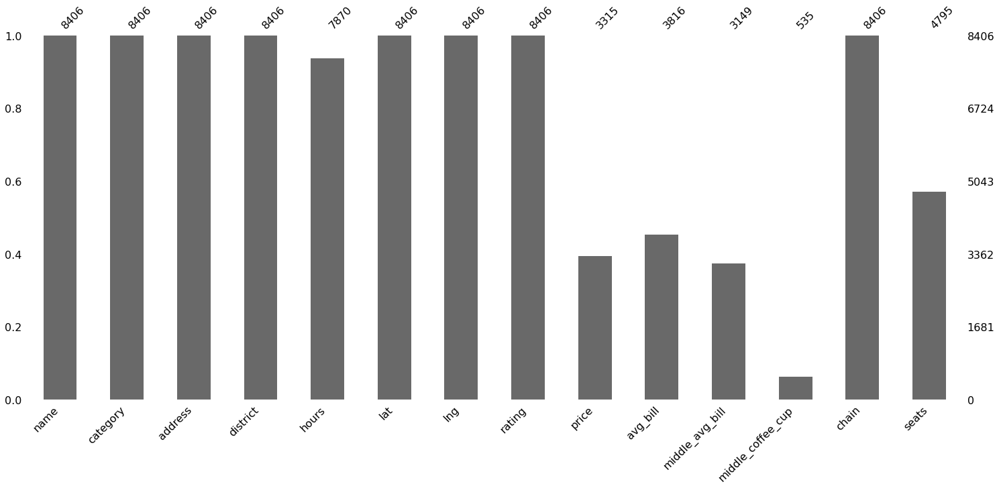

In [8]:
msno.bar(df);

Дубликатов в датафрейме нет. Пропуски в столбцах с ценовым диапазоном заведения, средним диапазоном счета, средним значением чека, средней стоимостью чашки капучино, количеством мест в заведении. Вполне  неплохо, учитывая, с какой скоростью в мегаполисе открываются и закрываются заведения общепита. Понятно, что отследить полную картину и заполнить все ячейки датафрейма невозможно, особенно для маленьких заведений. Заполнять их какими-либо значениями считаем нецелесообразным, так мы можем нарушить картину исследования.

Рассмотрим подробнее столбец со средним чеком. 

In [9]:
df['middle_avg_bill'].describe()

count    3,149.00
mean       958.05
std      1,009.73
min          0.00
25%        375.00
50%        750.00
75%      1,250.00
max     35,000.00
Name: middle_avg_bill, dtype: float64

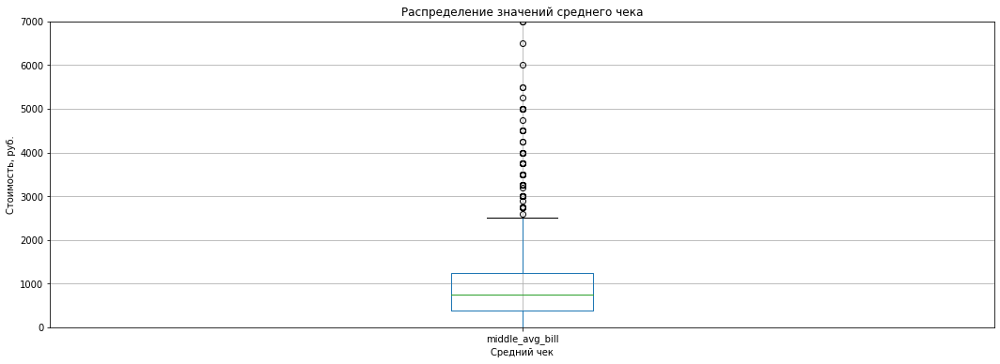

In [10]:
df[['middle_avg_bill']].boxplot( figsize=(18, 6))

plt.ylim([0,7000])
plt.title('Распределение значений среднего чека')
plt.ylabel('Стоимость, руб.')
plt.xlabel('Средний чек');

Среднее значение чека  для московских заведений общепита - 958 рублей. Медианное - чуть ниже - 750 рублей. Применительно к чеку, приятно смотреть на выбросы, значения которых - от 2-ух до 35 тысяч рублей. Но не будем забывать, что информация о среднем чеке представлена лишь чуть более чем для 37% всех заведений. Детальное изучение среднего чека будет ниже. 

Создадим столбец street с названиями улиц из столбца с адресом.

In [11]:
df['street'] = df['address'].str.split(', ').apply(lambda x: x[1])

Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- `True` — если заведение работает ежедневно и круглосуточно;
- `False` — в противоположном случае.

In [12]:
df['hours'].value_counts()

ежедневно, 10:00–22:00                                                  759
ежедневно, круглосуточно                                                730
ежедневно, 11:00–23:00                                                  396
ежедневно, 10:00–23:00                                                  310
ежедневно, 12:00–00:00                                                  254
                                                                       ... 
пн-пт 17:00–03:00; сб,вс 17:00–05:00                                      1
пн,вт 09:00–21:00; ср-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00      1
пн-пт 12:00–01:00                                                         1
пн-пт 10:30–21:30; сб,вс 10:30–22:30                                      1
пн-сб 10:30–21:30                                                         1
Name: hours, Length: 1307, dtype: int64

In [13]:
df['is_24_7'] = df['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)

In [14]:
df['is_24_7'].value_counts(normalize=True)


False   0.91
True    0.09
Name: is_24_7, dtype: float64

Лишь 9% заведений из датафрейма работают круглосуточно и 7 дней в неделю. Оставшийся 91% не соответствуют этому критерию.

Таким образом, мы подготовили данные, убедились в отсутствии дубликатов, выявили наличие пропусков в нескольких столбцах, определили выбросы в столбце со средним значением текста, подготовили дополнительные столбцы для дальнейшего анализа. Приступим к нему.

## Шаг 3. Анализ данных

### Изучим, какие категори заведений представлены в данных?

In [15]:
df_category = df['category'].value_counts(normalize=True).round(2).reset_index()

fig = px.bar(df_category, 
             x='index', 
             y='category', 
             text='category' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='Доля заведений по категориям',
                  xaxis_title='Категории заведений',
                  yaxis_title='Доля')
fig.show() 

По числу заведений кафе на 4 процентных пункта опережают рестораны. Философия общепита в Москве давно сменила курс с элитарного ресторанного, когда поход в ресторан был ритуалом для избранных, на повсеместный кафешный, когда любой может забежать в кафе и провести встречу, поработать, поучиться, просто  перекусить или переждать дождь. Этот тезис подтверждают и кафейни, которые на третьем месте, их 16,8% от всех заведений. За кофейнями с большим отрывом  идут пабы, пиццерии, фастфуд. Столовые и булочные в конце списка.

### Исследуем количество посадочных мест.

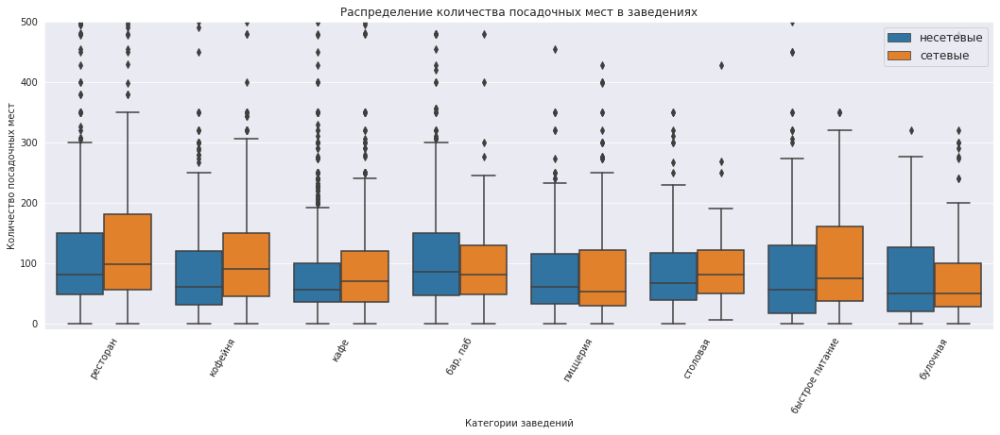

In [16]:
plt.figure(figsize=(18, 6))

sns.set_style("darkgrid")

sns.boxplot(x="category", y="seats", hue=df['chain'].map({0:"несетевые",1:"сетевые"}), data=df.sort_values('seats', ascending=False))

plt.xticks(rotation=60, fontsize=10)
plt.ylim([-10,500])
plt.title('Распределение количества посадочных мест в заведениях')
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест')
plt.legend(loc='upper right', fontsize=12)
plt.show()

У ресторанов, кофеен, кафе, пиццерий, ресторанов быстрого питания размах посадочных мест в сетевых заведениях выше, чем у несетевых. Бизнес сетевых заведений более выверенный, такие заведения меньше рискуют, следовательно, при большем числе посадочных мест потенциальный средний чек у них выше.
В среднем в заведениях от 30 до 180 посадочных мест.
Рассмотрим детальнее медианное количество мест.

In [17]:
df_seats = pd.pivot_table(df, index='category', values ='seats', aggfunc = 'median')\
.sort_values(by='seats', ascending = False)\
.reset_index()

In [18]:
fig = px.bar(df_seats, 
             x='category', 
             y='seats', 
             text='seats' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='Категории заведений по количеству посадочных мест',
                  xaxis_title='Категории заведений',
                  yaxis_title='Медианное количество мест')
fig.show() 

В ресторанах, пабах и кофейнях медианное число _(исследуем его, что застраховать себя от выбросов. При корректных данных медиана и среднее значение должны быть близки друг к другу)_ посадочных мест не меньше 80. Дальше идут столовые. Их мало, но они большие. В целом заведения в Москве достаточно крупные. Даже в булочных, которые на последнем месте в данном графике, медианное число посадочных мест равно 50. 

### Рассмотрим сетевые и несетевые заведения в датасете.

In [19]:
df_chain = df['chain'].value_counts().reset_index()

In [84]:
fig = go.Figure(data=[go.Pie(labels=df_chain['index'], 
                             values=df_chain['chain'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Соотношение несетевых и сетевых заведений, %', 
                  width=800, 
                  height=500, 
                  annotations=[dict(x=1.12, 
                                    y=1.05, 
                                    text='Несетевое(0)\ Сетевое(1):',
                                    showarrow=False)])
fig.show() 

Несетевых заведений почти 62%, тогда как сетевых около 38% _(при наведении на таблицу можно увидеть количественное соотношение заведений)_. Рассмотрим, какие категории заведений чаще являются сетевыми?

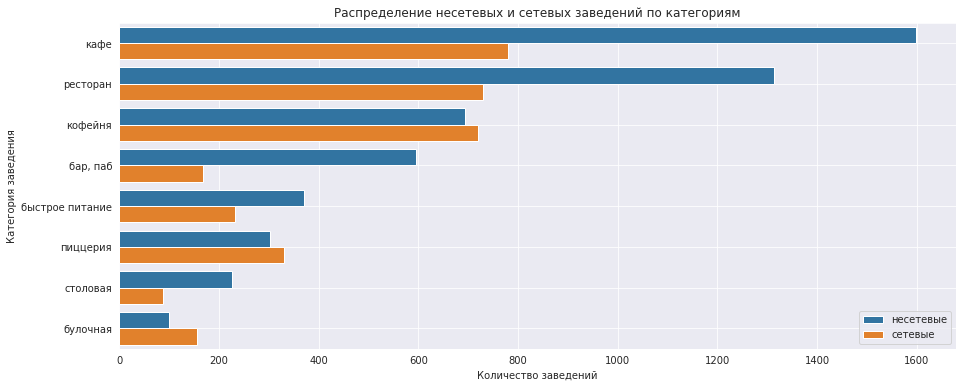

In [21]:
df_chain_categories = df\
.groupby(['category', 'chain'],as_index = False)[['name']]\
.count()\
.sort_values(by='name', ascending=False)

sns.set_style('dark')

plt.figure(figsize=(15, 6))

sns.barplot(x='name', y='category', data=df_chain_categories, hue=df_chain_categories['chain'].map({0:"несетевые",1:"сетевые"}))

plt.title('Распределение несетевых и сетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория заведения')
plt.legend(loc='lower right', fontsize=10)
plt.grid()
plt.show()

Половина кофеен и пиццерий - сетевые заведения. Среди кафе и ресторанов Москвы - таких треть. Самыми авторскими категориями можно назвать пабы и столовые, здесь сетевых только четверть заведений. Приверженность к сетям понятна и объяснима. С точки зрения бизнесов дешевле и безопаснее масштабировать узнаваемую и работающую концепцию, чем каждый раз вкладываться во что-то новое, понимая, что это новое рискует не "выстрелить".

### Определим ТОП-15 популярных сетей в Москве.

In [22]:
top_chain = df.loc[df['chain'] == 1, 'name'].value_counts().head(15).reset_index()

In [23]:
fig = px.bar(top_chain.sort_values(by='name'), 
             x='name', 
             y='index', 
             text='name' 
            )

fig.update_layout(title='ТОП-15 популярных сетей общепита в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название сети')
fig.show()

Все сети на слуху. Они и есть лидеры московского общепита по числу заведений. Впереди всех - "Шоколадница" (120 заведений). У следующей за ней "Домина'С Пиццы" почти двукратное отставание (76 заведений). 

Определим, какова доля этих сетей в рейтинге ТОП-15, исходя из количества заведений.

In [24]:
top_chain['share'] = (top_chain['name'] * 100 / top_chain['name'].sum()).round(2)
top_chain.columns = ['Название сети', 'Количество заведений', 'Доля в ТОП-15, %']
top_chain

,Название сети,Количество заведений,"Доля в ТОП-15, %"
0,Шоколадница,120,14.71
1,Домино'с Пицца,76,9.31
2,Додо Пицца,74,9.07
3,One Price Coffee,71,8.70
4,Яндекс Лавка,69,8.46
5,Cofix,65,7.97
6,Prime,50,6.13
7,Хинкальная,44,5.39
8,КОФЕПОРТ,42,5.15
9,Кулинарная лавка братьев Караваевых,39,4.78


In [25]:
fig = px.bar(top_chain, 
             x='Название сети', 
             y='Доля в ТОП-15, %', 
             text='Доля в ТОП-15, %' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='Доля сетей, входящих в ТОП-15, по количеству заведений, %',
                  xaxis_title='Название сети',
                  yaxis_title='Доля')
fig.show() 


Конкуренция у лидеров достаточно плотная. 

Выборочно рассмотрим, к каким категориям относятся сети, входящие в ТОП-15.

In [26]:
print(df[df['name'] == 'Шоколадница']['category'].unique())
print(df[df['name'] == "Теремок"]['category'].unique())
print(df[df['name'] == "Му-Му"]['category'].unique())
print(df[df['name'] == "Prime"]['category'].unique())

['кофейня' 'кафе']
['ресторан' 'быстрое питание']
['кафе' 'ресторан' 'кофейня' 'быстрое питание' 'пиццерия' 'столовая'
 'бар, паб']
['ресторан' 'кафе']


Заведения сетей работают в разных категориях. "Му-му", например, представлена в 7 категориях из 8, охваченных датафреймом. Строить график, определяющий принадлежность сети к какой-то одной категории, будет некорректно.

Отобразим количество заведений сетей из ТОП-15 по округам.

In [27]:
array_name = top_chain['Название сети'].to_numpy () 

top_15_district = df.query('name in @array_name')\
.pivot_table(index = ['district', 'name'], values = 'address', aggfunc = 'count')\
.reset_index().sort_values(by=['address'], ascending=False)

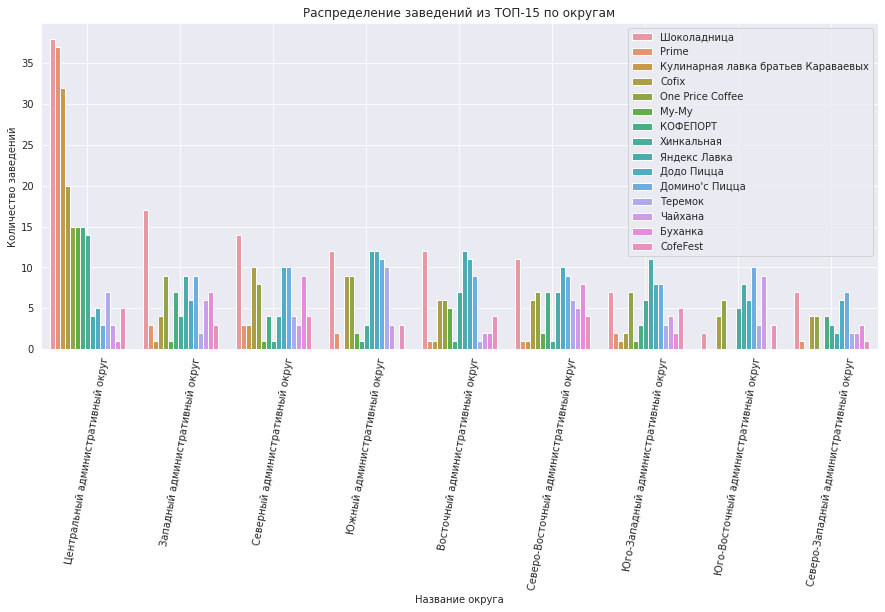

In [28]:
sns.set_style('dark')

plt.figure(figsize=(15, 6))

sns.barplot(x='district', y='address', data=top_15_district, hue='name')

plt.title('Распределение заведений из ТОП-15 по округам')
plt.xlabel('Название округа')
plt.ylabel('Количество заведений')
plt.legend(loc='upper right', fontsize=10)
plt.grid()
plt.xticks(rotation=80)
plt.show()

В Северо-Западной, Юго-Восточном, Южном-административном округах представлены не все сети из ТОП-15.
В самом "аппетитном" для размещения из-за высокой концентрации людей и офисов Центральном округе очевидно лидерство сетей "Шоколадница", "Prime", "Кулинарная лавка братьев Караваевых", Cofix. 

Отобразим заведения на карте.

In [29]:
top_15_coordinate = df.query('name in @array_name')

In [30]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

In [31]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [32]:
try:
    state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'

In [33]:
Choropleth(
    geo_data=state_geo,
    width=800, 
    height=600
).add_to(m);

In [34]:
top_15_coordinate.apply(create_clusters, axis=1)

m

### Рассмотрим заведения по округам.

Расширим анализ. Отобразим общее количество заведений и количество заведений каждой категории по округам.

In [35]:
districts = df.pivot_table(index=['district', 'category'], values='name', aggfunc='count')\
.reset_index().sort_values(by='name', ascending=False)

In [36]:
total_name_distrist = districts.groupby('district')['name'].sum().reset_index().sort_values(by='name', ascending=False)

In [37]:
fig = px.bar(total_name_distrist, 
             x='district', 
             y='name', 
             text='name' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='Всего заведений по округам',
                  xaxis_title='Название округа',
                  yaxis_title='Количество заведений')
fig.show() 

Все заведения общепита рвутся в центр гороода. В Центральном округе заведений более чем вдвое больше, в сравнении с любым другим округом Москвы. Немалую роль в такой картине играют обозначенные выше четыре сети - лидеры Центрального административного округа. Меньше всего заведений в Северо-Западном административном округе.

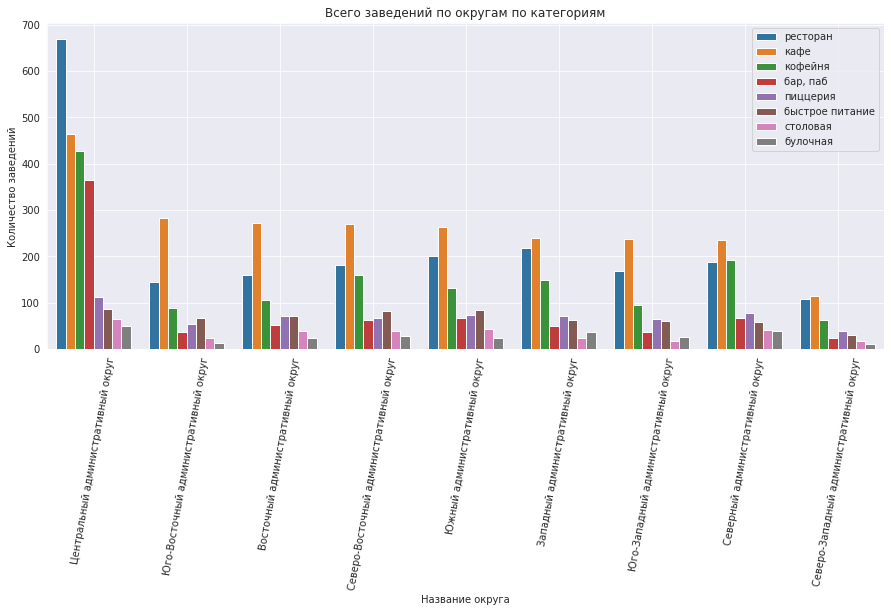

In [38]:
sns.set_style('dark')

plt.figure(figsize=(15, 6))

sns.barplot(x='district', y='name', data=districts, hue='category')

plt.title('Всего заведений по округам по категориям')
plt.xlabel('Название округа')
plt.ylabel('Количество заведений')
plt.legend(loc='upper right', fontsize=10)
plt.grid()
plt.xticks(rotation=80)
plt.show()

Во всех округах выделяется число кафе, ресторанов и кофеен. Интересно, что в Ценральном округе к ним примкнули и пабы. Вероятно, такое их количество обусловлено концентрацией офисов в центре, а также туристических мест. И белые воротнички, и туристы - завсегдатаи таких заведений.

### Рассмотрим рейтинги заведений.

Рассчитаем медианные рейтинги по категориям.

In [39]:
df_rating = df.pivot_table(index='category', values='rating', aggfunc='median')\
.round(2).reset_index()\
.sort_values(by='rating', ascending=False)

fig = px.bar(df_rating, 
             x='category', 
             y='rating', 
             text='rating' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='Медианные рейтинги по категориям заведений',
                  xaxis_title='Категории заведений',
                  yaxis_title='Средний рейтинг')
fig.show() 

Картина более-менее одинаковая. Явных категорий-фаворитов, равно как и аутсайдеров, судя по медианным рейтингам, нет. 

Проанализируем выбросы.

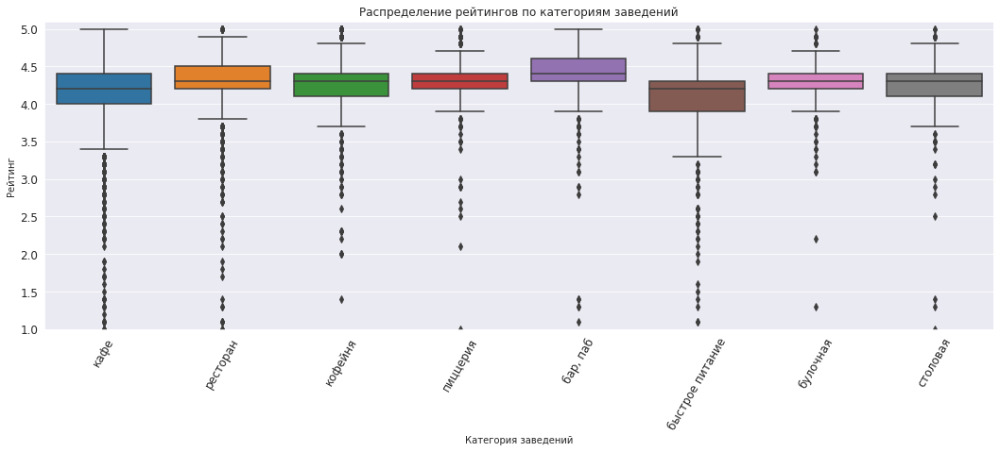

In [40]:
plt.figure(figsize=(18, 6))
sns.set_style("darkgrid")
sns.boxplot(x="category", y="rating", data=df)
plt.xticks(rotation=60, fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(1, 5.1)
plt.title('Распределение рейтингов по категориям заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Рейтинг')
plt.show()

Открылось интересное наблюдение. Выбросы чаще всего в меньшую сторону. Недовольные обслуживанием клиенты охотнее ставят низкие оценки, чем довольные высокие. Гораздо чаще. У кафе и баров вообще нет положительных выбросов.

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [41]:
df_rating_district = df.pivot_table(index='district', values='rating', aggfunc='median')\
.round(2).reset_index().sort_values(by='rating', ascending=False)

In [42]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=df_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по округам',
    width=800, 
    height=600
).add_to(m)

m

In [43]:
df_rating_district.columns = ['Название округа', 'Медианный рейтинг']
df_rating_district

,Название округа,Медианный рейтинг
5,Центральный административный округ,4.40
0,Восточный административный округ,4.30
1,Западный административный округ,4.30
2,Северный административный округ,4.30
4,Северо-Западный административный округ,4.30
7,Юго-Западный административный округ,4.30
8,Южный административный округ,4.30
3,Северо-Восточный административный округ,4.20
6,Юго-Восточный административный округ,4.20


Заведению бьются за рейтинг не столько в своей категории, сколько, исходя из расположения. В первую очередь, в Центральном округе, где сильнее конкуренция. Здесь самый высокий медианный показатель (4,4), самый низкий медианный показатель рейтинга у Северо-Восточного и Юго-Восточного административного округов - (4,2). 

### Построим хороплет по всем заведениям.

Для удобства и информативности, а также экономии памяти при загрузке отобразим все заведения датасета и их рейтинг на карте с помощью кластеров.

In [44]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

In [45]:
# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [46]:
df.apply(create_clusters, axis=1)

m

### Составим ТОП-15 улиц по количеству заведений. 

In [47]:
array_street = df.pivot_table(index=['street'], values ='name', aggfunc = 'count')\
.sort_values(by='name', ascending=False)\
.head(15)\
.reset_index()\
['street'].to_numpy()

In [48]:
top_15_street = df.query('street in @array_street')\
.pivot_table(index = ['street', 'category'], values = 'name', aggfunc = 'count')\
.reset_index().sort_values(by='name', ascending=False)

In [49]:
top_15_street_total = top_15_street.groupby('street')['name'].sum().reset_index().sort_values(by='name', ascending=False)

In [50]:
fig = px.bar(top_15_street_total, 
             x='street', 
             y='name', 
             text='name' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='ТОП-15 улиц по количеству заведений',
                  xaxis_title='Название улиц',
                  yaxis_title='Количество заведений')
fig.show() 

На длинных и крупных улицах всегда много людей и транспорта, и концентрация точек питания там высокая. 

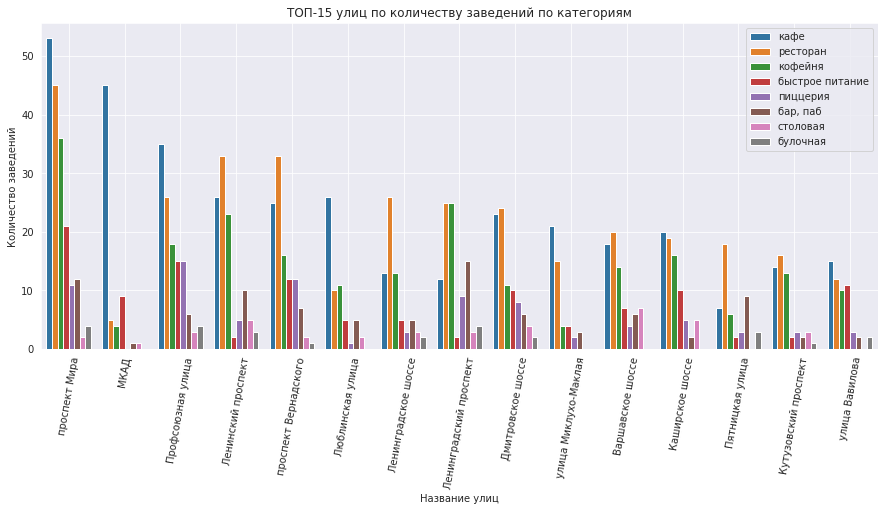

In [51]:
sns.set_style('dark')

plt.figure(figsize=(15, 6))

sns.barplot(x='street', y='name', data=top_15_street, hue = 'category')

plt.title('ТОП-15 улиц по количеству заведений по категориям')
plt.xlabel('Название улиц')
plt.ylabel('Количество заведений')
plt.legend(loc='upper right', fontsize=10)
plt.grid()
plt.xticks(rotation=80)
plt.show()

На МКАД ни одной пиццерии и  булочной, зато одни кафе (видимо, в первую очередь, на заправках).

На Пятницкой улице - ни одной столовой, хотя не исключено, что данная категория общепита может быть востребована среди местных жителей и небогатых туристов.

В остальном на всех улицах в лидерах кафе, кофейни, рестораны. В ряде скоростных магистралей к ним добавился фастфуд.

### Найдем улицы, на которых находится только один объект общепита.

In [52]:
grouped_by_street = df.pivot_table(index=['street'], values ='name', aggfunc = 'count')\
.sort_values(by='name')\
.reset_index()

street_one_rest = grouped_by_street.loc[grouped_by_street['name'] == 1]
print('Улиц с одним заведением общепита -', street_one_rest.shape[0])

Улиц с одним заведением общепита - 458


In [53]:
street_one_rest_array = street_one_rest['street'].to_numpy()

In [54]:
one_street_district = df.query('street in @street_one_rest_array')\
.pivot_table(index = ['district', 'category'], values = 'name', aggfunc = 'count')\
.reset_index().sort_values(by='name', ascending=False)

In [55]:
one_street_district_total = one_street_district.groupby('district')['name'].sum().reset_index().sort_values(by='name', ascending=False)

In [56]:
fig = px.bar(one_street_district_total, 
             x='district', 
             y='name', 
             text='name' 
            )

fig.update_layout(width=1000, 
                  height=500,
                  title='Концентрация улиц с одним заведением по округам',
                  xaxis_title='Название округов',
                  yaxis_title='Количество улиц')
fig.show() 

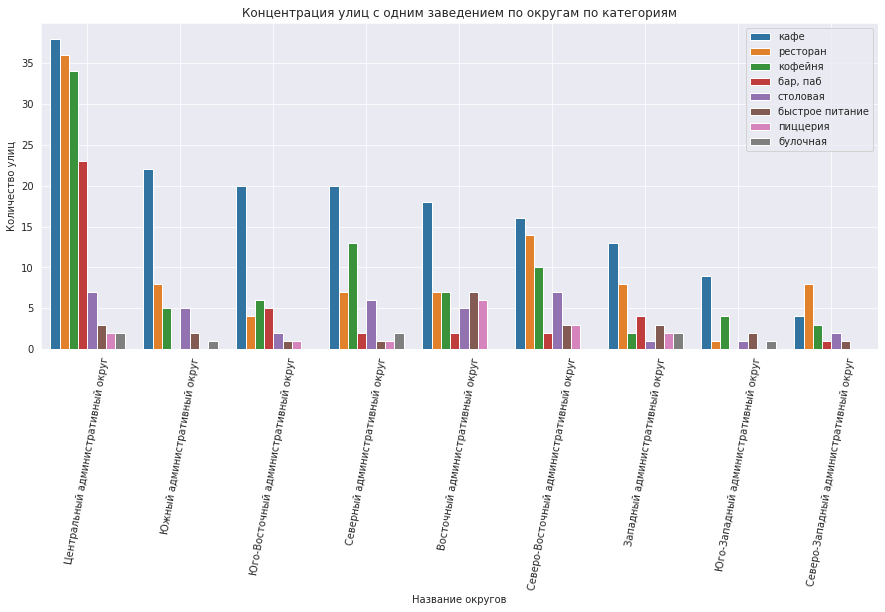

In [57]:
sns.set_style('dark')

plt.figure(figsize=(15, 6))

sns.barplot(x='district', y='name', data=one_street_district, hue = 'category')

plt.title('Концентрация улиц с одним заведением по округам по категориям')
plt.xlabel('Название округов')
plt.ylabel('Количество улиц')
plt.legend(loc='upper right', fontsize=10)
plt.grid()
plt.xticks(rotation=80)
plt.show()

Улицы с одним заведением гораздо чаще встречаются в центре Москвы. Скорее всего, это короткие улочки, переулки, проезды, тупики. Такие улицы и не позволяют раместить много точек питания.

В большинстве округов на таких улицах чаще всего размещают кафе. В центре - еще кофейни и рестораны, чуть реже - пабы.

### Изучим средний чек.

Посчитаем медианный средний чек для каждого округа, информацию разместим в виде фоновой картграммы.

In [58]:
df_bill_district = df.pivot_table(index=['district'], values ='middle_avg_bill', aggfunc = 'median')\
.sort_values(by='middle_avg_bill', ascending=False)\
.reset_index()

In [59]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=df_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по округам',
    width=800, 
    height=600
).add_to(m)

m

In [60]:
df_bill_district.columns = ['Название округа', 'Медианный средний чек']
df_bill_district

,Название округа,Медианный средний чек
0,Западный административный округ,"1,000.00"
1,Центральный административный округ,"1,000.00"
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


Центр и запад - самые дорогие округа. И медианный чек там соответствующий. На юге и северо-востоке - в два раза дешевле. На юго-востоке - и того больше.

Рассмотрим распределение среднего чека в несетевых и сетевых заведениях по категориям.

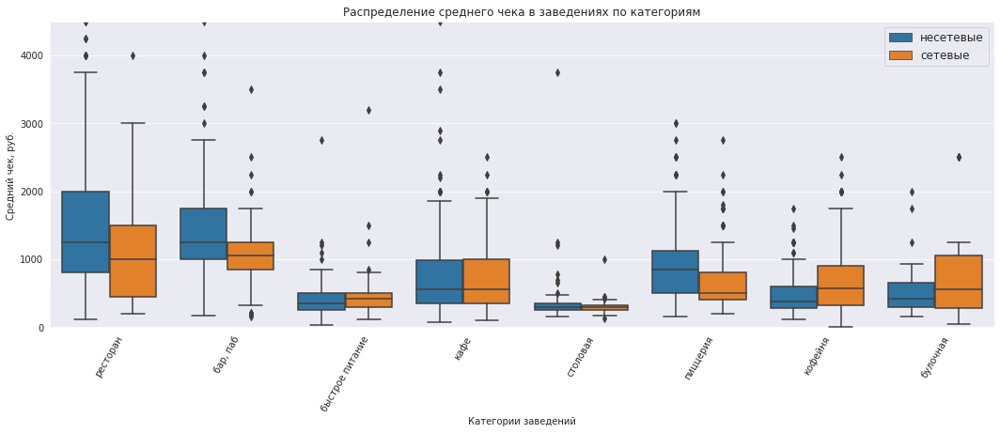

In [61]:
plt.figure(figsize=(18, 6))
sns.set_style("darkgrid")
sns.boxplot(x="category", y="middle_avg_bill", hue=df['chain'].map({0:"несетевые",1:"сетевые"}), data=df.sort_values('middle_avg_bill', ascending=False))
plt.xticks(rotation=60, fontsize=10)
plt.ylim([-10,4500])
plt.title('Распределение среднего чека в заведениях по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Средний чек, руб.')
plt.legend(loc='upper right', fontsize=12)
plt.show()

У столовых самое маленькое распределение. У фастфуда немного больше. Но это самые технологичные и быстрые категории, рассчитанные на столько на диапазон среднего чека, сколько на объем и скорость обслуживания.

Медианный чек на сумму более 1 тысячи рублей у ресторанов и пабов, причем у несетевых заведений этих категорий медиана выше. 

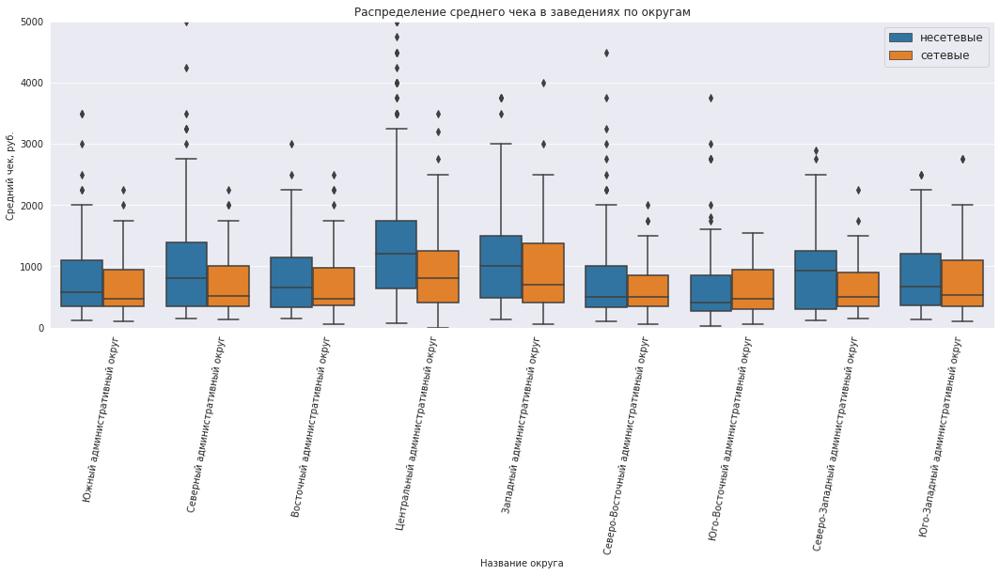

In [62]:
plt.figure(figsize=(18, 6))

sns.set_style("darkgrid")
sns.boxplot(x="district", y="middle_avg_bill", hue=df['chain'].map({0:"несетевые",1:"сетевые"}), data=df.sort_values('middle_avg_bill', ascending=False))

plt.xticks(rotation=60, fontsize=10)
plt.ylim([-10,5000])
plt.title('Распределение среднего чека в заведениях по округам')
plt.xlabel('Название округа')
plt.ylabel('Средний чек, руб.')
plt.legend(loc='upper right', fontsize=12)
plt.xticks(rotation=80)
plt.show()

Центральный и Западный административный округ выглядят увереннее по распределению среднего чека. В несетевых и сетевых заведениях у них и медиана выше, чем в других округах, и правый ус "ящика с усами" длиннее, следовательно, здесь больше состоятельных клиентов, готовых платить сильно больше медианного значения. 

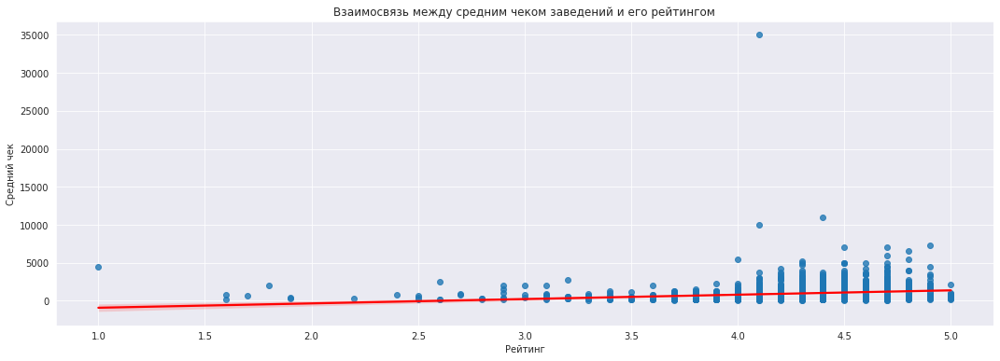

Коэффициент корреляции:  0.18323797147624538


In [63]:
plt.figure(figsize = (18,6))
sns.regplot(x = 'rating', y = 'middle_avg_bill', data = df, line_kws={'color':'red'})
plt.title('Взаимосвязь между средним чеком заведений и его рейтингом')
plt.xlabel('Рейтинг')
plt.ylabel('Средний чек')
plt.show()
print('Коэффициент корреляции: ', df['rating'].corr(df['middle_avg_bill']))

Метод расчета корреляции не видит зависимости между рейтингом заведения и его средним чеком...

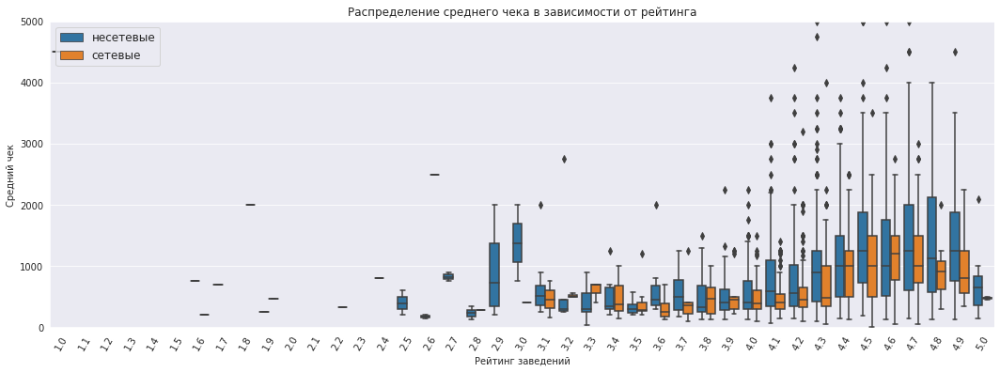

In [64]:
plt.figure(figsize=(18, 6))

sns.set_style("darkgrid")
sns.boxplot(x="rating", y="middle_avg_bill", hue=df['chain'].map({0:"несетевые",1:"сетевые"}), data=df.sort_values('middle_avg_bill', ascending=False))

plt.xticks(rotation=60, fontsize=10)
plt.ylim([-10,5000])
plt.title('Распределение среднего чека в зависимости от рейтинга')
plt.xlabel('Рейтинг заведений')
plt.ylabel('Средний чек')
plt.legend(loc='upper left', fontsize=12)
plt.show()

Хотя визуально эту взаимосвязь обозначить можно: чем выше рейтинг заведения,тем выше медианы, больше распределения, включая правые усы. Особенно эта закономерность заметна у несетевых заведений.

### Вывод по результатам анализа данных

1. Философия общепита в Москве давно сменила курс с элитарного ресторанного на повсеместный кафешно-кофейно-пиццерийно-фастфудный. Во всех сегментах и округах конкуренция высокая. Меньше всего в городе столовых и булочных.
2. В среднем в заведениях от 30 до 180 посадочных мест.
3. Несетевых заведений почти 62%, тогда как сетевых около 38%. Половина кофеен и пиццерий - сетевые заведения. Среди кафе и ресторанов Москвы - таких треть. Сетевые заведения дешевле и безопаснее масштабировать.
4. Лидер среди сетей - "Шоколадница" (120 заведений). У следующей за ней "Домина'С Пиццы" почти двукратное отставание (76 заведений).
5. В самом "аппетитном" для размещения из-за высокой концентрации людей и офисов Центральном округе очевидно лидерство сетей "Шоколадница", "Prime", "Кулинарная лавка братьев Караваевых", Cofix. Из-за них в Центральном округе заведений более чем вдвое больше, в сравнении с любым другим округом Москвы.
6. Во всех округах выделяется число кафе, ресторанов и кофеен. В Центральном округе к ним примкнули и пабы.
7. На Пятницкой улице, входящей в ТОП-15 самых насыщенных по числу заведений и находящейся в центре города, нет ни одной столовой. 
8. Центр и запад - самые дорогие округа. И медианный средний чек там выше, и распределение. Причем как в несетевых, так и в сетевых заведениях.

## Шаг 4. Исследование кофеен

Основатели фонда «Shut Up and Take My Money» мечтают открыть кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере. Задача определить, осуществима ли задумка клиентов.

Сколько всего кофеен в датасете? 

In [65]:
print('Число кофеен в датасете -', df.loc[df['category'] == 'кофейня', 'name'].count())

Число кофеен в датасете - 1413


Есть ли круглосуточные кофейни?

In [66]:
print('Число круглосуточных кофеен в датасете -', df.query('category == "кофейня" and is_24_7 == True')['name'].count())

Число круглосуточных кофеен в датасете - 59


### Какие у кофеен рейтинги? 

In [67]:
coffee_house = df.query('category == "кофейня"')

In [68]:
coffee_house_rating = coffee_house.pivot_table(index = 'name', values = 'rating', aggfunc = 'median').reset_index()
coffee_house_rating.describe()


,rating
count,839.00
mean,4.35
std,0.35
min,1.40
25%,4.20
50%,4.40
75%,4.50
max,5.00


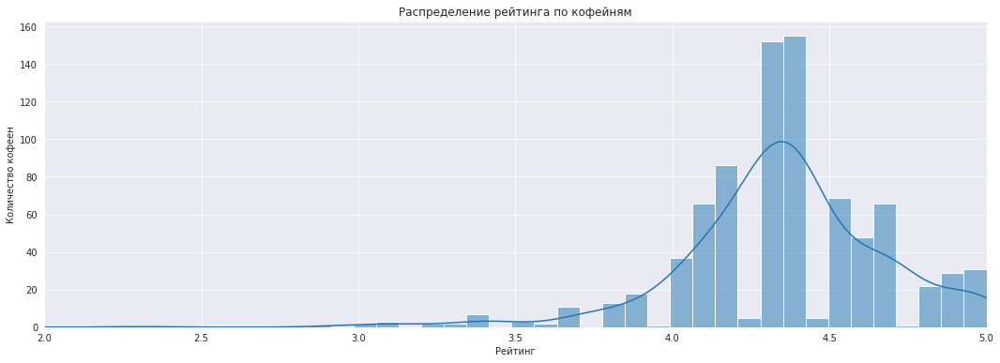

In [69]:
plt.figure(figsize = (18,6))

sns.histplot(x='rating', data=coffee_house_rating, kde=True, bins=50)

plt.xlim(2, 5)
plt.title('Распределение рейтинга по кофейням')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен')
plt.show()

### Как кофейни распределяются по округам?

In [89]:
coffee_house_district = coffee_house\
.pivot_table(index = ['district', 'chain'], values = 'name', aggfunc = 'count')\
.reset_index()\
.sort_values(by='name', ascending = False)

In [92]:
fig = px.bar(coffee_house_district, 
             x='district', 
             y='name', 
             text='name', 
             color = 'chain'
            )

fig.update_layout(width=1200, 
                  height=500,
                  showlegend=False,
                  title='Количество несетевых (синий) и сетевых (желтый) кофеен по округам',
                  xaxis_title='Название округа',
                  yaxis_title='Количество заведений')
fig.show() 

### На какую стоимость чашки капучино стоит ориентироваться?

In [93]:
coffee_house_cup = coffee_house.pivot_table(index = 'name', values = 'middle_coffee_cup', aggfunc = 'median').reset_index()
coffee_house_cup.describe()


,middle_coffee_cup
count,332.00
mean,176.07
std,54.12
min,60.00
25%,137.25
50%,170.00
75%,210.00
max,375.00


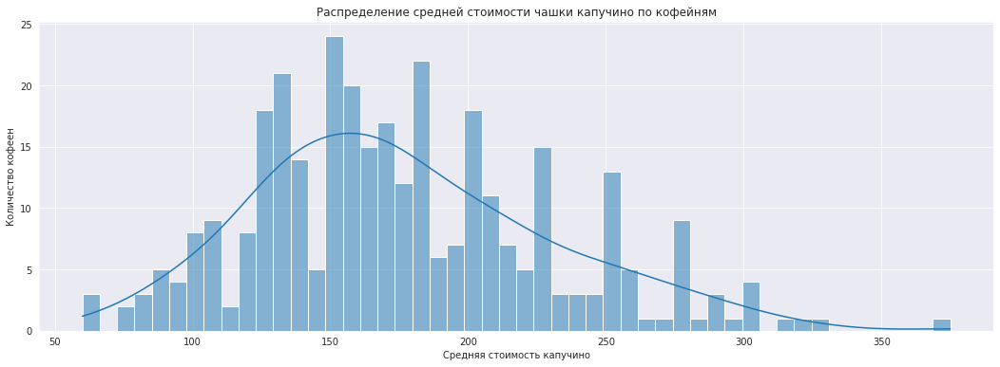

In [94]:
plt.figure(figsize = (18,6))

sns.histplot(x='middle_coffee_cup', data=coffee_house_cup, kde=True, bins=50)

plt.title('Распределение средней стоимости чашки капучино по кофейням')
plt.xlabel('Средняя стоимость капучино')
plt.ylabel('Количество кофеен')
plt.show()

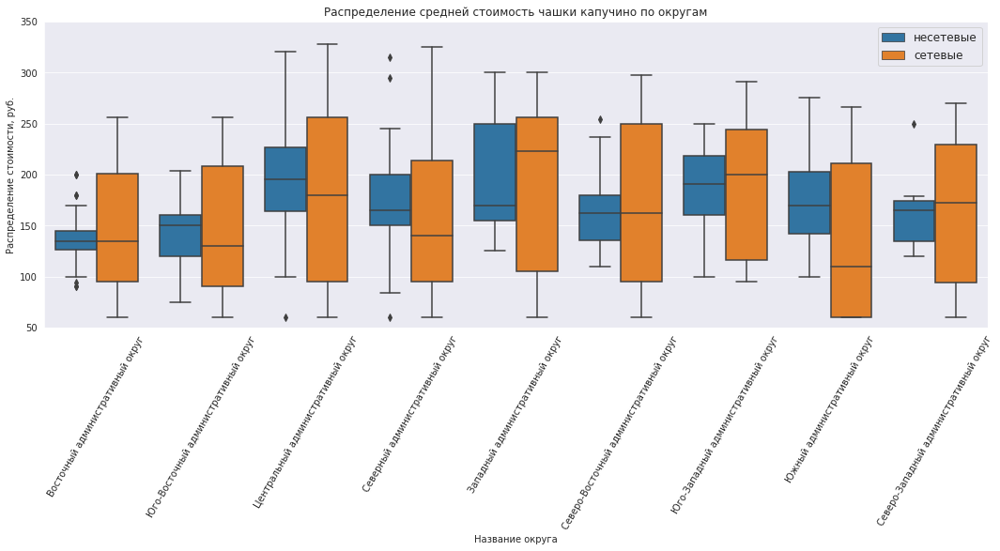

In [95]:
plt.figure(figsize=(18, 6))

sns.set_style("darkgrid")
sns.boxplot(x="district", y="middle_coffee_cup", hue=coffee_house['chain'].map({0:"несетевые",1:"сетевые"}), data=coffee_house\
            .sort_values('middle_coffee_cup', ascending=False))

plt.xticks(rotation=60, fontsize=10)
plt.ylim([50,350])
plt.title('Распределение средней стоимость чашки капучино по округам')
plt.xlabel('Название округа')
plt.ylabel('Распределение стоимости, руб.')
plt.legend(loc='upper right', fontsize=12)
plt.show()

### Рекомендации по открытию кофеен

Если и открывать кофейню в условиях жесточайшей конкуренции в данной категории, рекомендуем рассмотреть вариант открытия сетевого заведения в Западном административном округе.

Средний чек в ЗАО самый высокий, наравне с Центральным, но заведений там гораздо меньше и стоимость аренды, надо полагать, ниже. При этом в округе много крупных деловых (в том числе Москва-Сити) и торговых центров, улиц с высоким трафиком. Медианный средний чек чашки капучино в сетевом заведении в Западном округе даже выше, чем в центре, в районе 230 рублей.

Открытие именно сетевого заведения поможет уменьшить риски, так как у сети уже сформулированы свои требования к выбору места и организации работы заведения, организации бизнеса, есть узнаваемый бренд и опыт.

Кроме того, в сетевых заведениях больше посадочных мест. Такие заведения меньше рискуют, следовательно, при большем числе посадочных мест потенциальный средний чек у них выше.


В качестве альтернативного варианта предлагаем рассмотреть открытие столовой на Пятницкой улице в центре города. Эта улица входит в ТОП-15 улиц с самым большим количеством заведений общепита, при этом на ней нет ни одной столовой. Данная категория может быть востребована среди местных жителей и небогатых туристов, благодаря своей доступности и скорости обслуживания. Распределение среднего чека в столовых небольшое, однако при отлаженности технологии работы и удачном выборе места на людной городской улице можно рассчитывать на большой поток клиентов.


## Шаг 5. Подготовка презентации

[Презентация](https://docs.google.com/presentation/d/199nwoqVUfnunzfAFmOY_i93fSufhPJoF/edit?usp=sharing&ouid=107737819750945617634&rtpof=true&sd=true)